In [1]:
import numpy as np
from PIL import Image, ImageDraw
from scipy.ndimage import shift

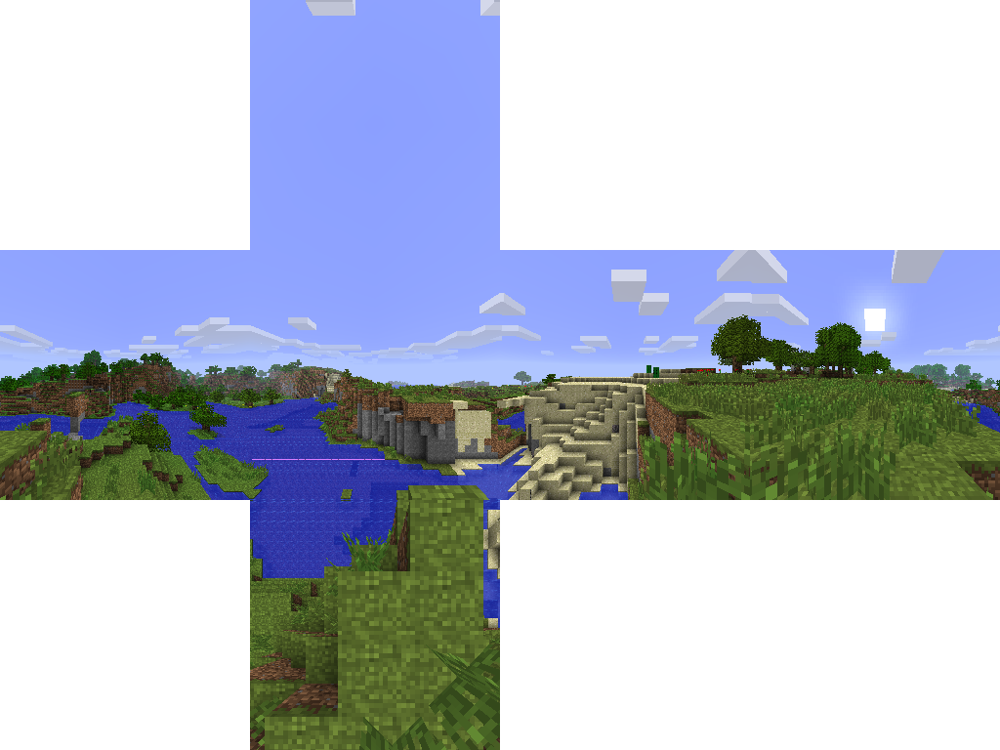

In [2]:
im = Image.open("src.png")
draw = ImageDraw.Draw(im) 
im

In [3]:
# origin block

originx = 61
originy = 74
originz = -69

# approximate values
xoff=-0.0112
yoff=1.62
zoff=-0.2352
coff=0.1 #0.09387 # calculated by best fit, this is "camera offset" behind eye position


# magic (90 FOV)
m1=128

In [4]:
scale = 8

def getcorner(v,h,d):
    if d < 0:
        return (np.nan,np.nan)
    vpxl = (128-v/d*m1)
    if vpxl > 255+5:
        vpxl = np.nan
    if vpxl < 0-5:
        vpxl = np.nan
    hpxl = (h/d*m1+128)
    if hpxl > 255+5:
        hpxl = np.nan
    if hpxl < 0-5:
        hpxl = np.nan
    #print(vpxl,hpxl)
    return (vpxl,hpxl)

def getcornerdownview(x,y,z):
    vpxl,hpxl = getcorner(z-zoff,-x+xoff,-y+yoff+coff)
    return ((vpxl+256*2)*scale,(hpxl+256)*scale)

def getcornerupview(x,y,z):
    vpxl,hpxl = getcorner(-z+zoff,-x+xoff,y-yoff+coff)
    return ((vpxl+256*0)*scale,(hpxl+256)*scale)

def getcornersouthview(x,y,z):
    vpxl,hpxl = getcorner(y-yoff,-x+xoff,z-zoff+coff)
    return ((vpxl+256)*scale,(hpxl+256)*scale)

def getcornereastview(x,y,z):
    vpxl,hpxl = getcorner(y-yoff,z-zoff,+x-xoff+coff)
    return ((vpxl+256)*scale,(hpxl+256*0)*scale)

def getcornerwestview(x,y,z):
    vpxl,hpxl = getcorner(y-yoff,-z+zoff,-x+xoff+coff)
    return ((vpxl+256)*scale,(hpxl+256*2)*scale)

def getcornernorthview(x,y,z):
    vpxl,hpxl = getcorner(y-yoff,x-xoff,-z+zoff+coff)
    return ((vpxl+256)*scale,(hpxl+256*3)*scale)

def drawlines(draw,h1,v1,h2,v2,h3,v3,h4,v4,y):
    color = ['red','orange','yellow','green','blue','purple'][y%6]
    if np.isfinite([h1,v1,h2,v2]).all():
        draw.line((h1,v1,h2,v2), fill=color)
    if np.isfinite([h2,v2,h3,v3]).all():
        draw.line((h2,v2,h3,v3), fill=color)
    if np.isfinite([h3,v3,h4,v4]).all():
        draw.line((h3,v3,h4,v4), fill=color)
    if np.isfinite([h4,v4,h1,v1]).all():
        draw.line((h4,v4,h1,v1), fill=color)

def applyRect(draw,y,a,b,c,d,e,f,g,h,i,j,k,l):
    v1,h1 = getcornernorthview(a,b,c)
    v2,h2 = getcornernorthview(d,e,f)
    v3,h3 = getcornernorthview(g,h,i)
    v4,h4 = getcornernorthview(j,k,l)
    
    drawlines(draw,h1,v1,h2,v2,h3,v3,h4,v4,y)
    
    v1,h1 = getcornersouthview(a,b,c)
    v2,h2 = getcornersouthview(d,e,f)
    v3,h3 = getcornersouthview(g,h,i)
    v4,h4 = getcornersouthview(j,k,l)
    
    drawlines(draw,h1,v1,h2,v2,h3,v3,h4,v4,y)
    
    v1,h1 = getcornereastview(a,b,c)
    v2,h2 = getcornereastview(d,e,f)
    v3,h3 = getcornereastview(g,h,i)
    v4,h4 = getcornereastview(j,k,l)
    
    drawlines(draw,h1,v1,h2,v2,h3,v3,h4,v4,y)
    
    v1,h1 = getcornerwestview(a,b,c)
    v2,h2 = getcornerwestview(d,e,f)
    v3,h3 = getcornerwestview(g,h,i)
    v4,h4 = getcornerwestview(j,k,l)
    
    drawlines(draw,h1,v1,h2,v2,h3,v3,h4,v4,y)
    
    v1,h1 = getcornerdownview(a,b,c)
    v2,h2 = getcornerdownview(d,e,f)
    v3,h3 = getcornerdownview(g,h,i)
    v4,h4 = getcornerdownview(j,k,l)
    
    drawlines(draw,h1,v1,h2,v2,h3,v3,h4,v4,y)
    
    v1,h1 = getcornerupview(a,b,c)
    v2,h2 = getcornerupview(d,e,f)
    v3,h3 = getcornerupview(g,h,i)
    v4,h4 = getcornerupview(j,k,l)
    
    drawlines(draw,h1,v1,h2,v2,h3,v3,h4,v4,y)

def drawTop(draw,x,z,y):
    
    applyRect(draw,y,
              x+0.5,y,z+0.5,
              x-0.5,y,z+0.5,
              x-0.5,y,z-0.5,
              x+0.5,y,z-0.5
             )

def drawWest(draw,x,z,y):
    
    applyRect(draw,y,
              x-0.5,y,z+0.5,
              x-0.5,y,z-0.5,
              x-0.5,y-1,z-0.5,
              x-0.5,y-1,z+0.5
             )

def drawNorth(draw,x,z,y):
    
    applyRect(draw,y,
              x+0.5,y,z-0.5,
              x-0.5,y,z-0.5,
              x-0.5,y-1,z-0.5,
              x+0.5,y-1,z-0.5
             )

# use these functions:
def topface(draw,x,y,z):
    drawTop(draw,x-originx,z-originz,y-originy)
def westface(draw,x,y,z):
    drawWest(draw,x-originx,z-originz,y-originy)
def northface(draw,x,y,z):
    drawNorth(draw,x-originx,z-originz,y-originy)


In [5]:
im = Image.open("src.png")
im = im.resize((256*scale*4,256*scale*3),resample=Image.NEAREST)
imcopy = im.copy()
draw = ImageDraw.Draw(imcopy) 
draw.rectangle([0,0,256*4*scale,256*3*scale],fill='white')
imcopy.paste(im,(0,0),im)
im = imcopy
draw = ImageDraw.Draw(im) 

In [6]:
# water y level = 63
# player foot level = 74
for i in range(originx-80,originx+80):
    for j in range(originz-80,originz+80):
        topface(draw,i,63,j)
        pass

In [7]:
im

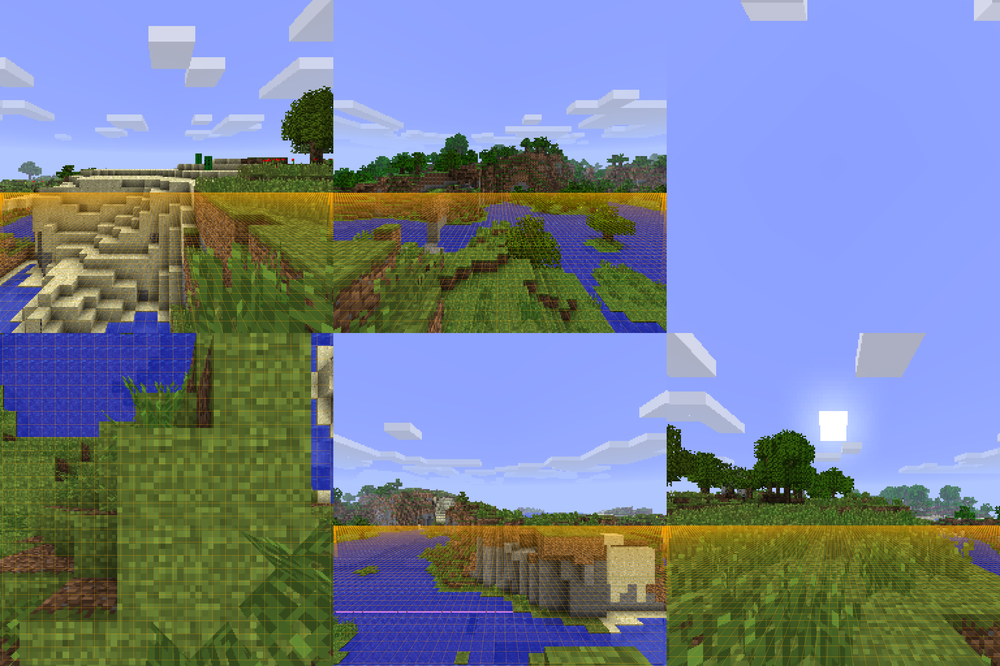

In [8]:
# convert to cube viewer format

imb = Image.new('RGB',(256*scale*3,256*scale*2))

bottom = im.crop([256*scale,256*2*scale,256*2*scale,256*3*scale])
imb.paste(bottom,(256*scale*0,256*scale*1))
front = im.crop([256*scale,256*1*scale,256*2*scale,256*2*scale])
imb.paste(front,(256*scale*1,256*scale*1))
back = im.crop([256*scale*3,256*1*scale,256*4*scale,256*2*scale])
imb.paste(back,(256*scale*2,256*scale*1))
top = im.crop([256*scale,256*0*scale,256*2*scale,256*1*scale])
imb.paste(top,(256*scale*2,256*scale*0))
left = im.crop([256*scale*0,256*1*scale,256*1*scale,256*2*scale])
imb.paste(left,(256*scale*1,256*scale*0))
right = im.crop([256*scale*2,256*1*scale,256*3*scale,256*2*scale])
imb.paste(right,(256*scale*0,256*scale*0))

imb

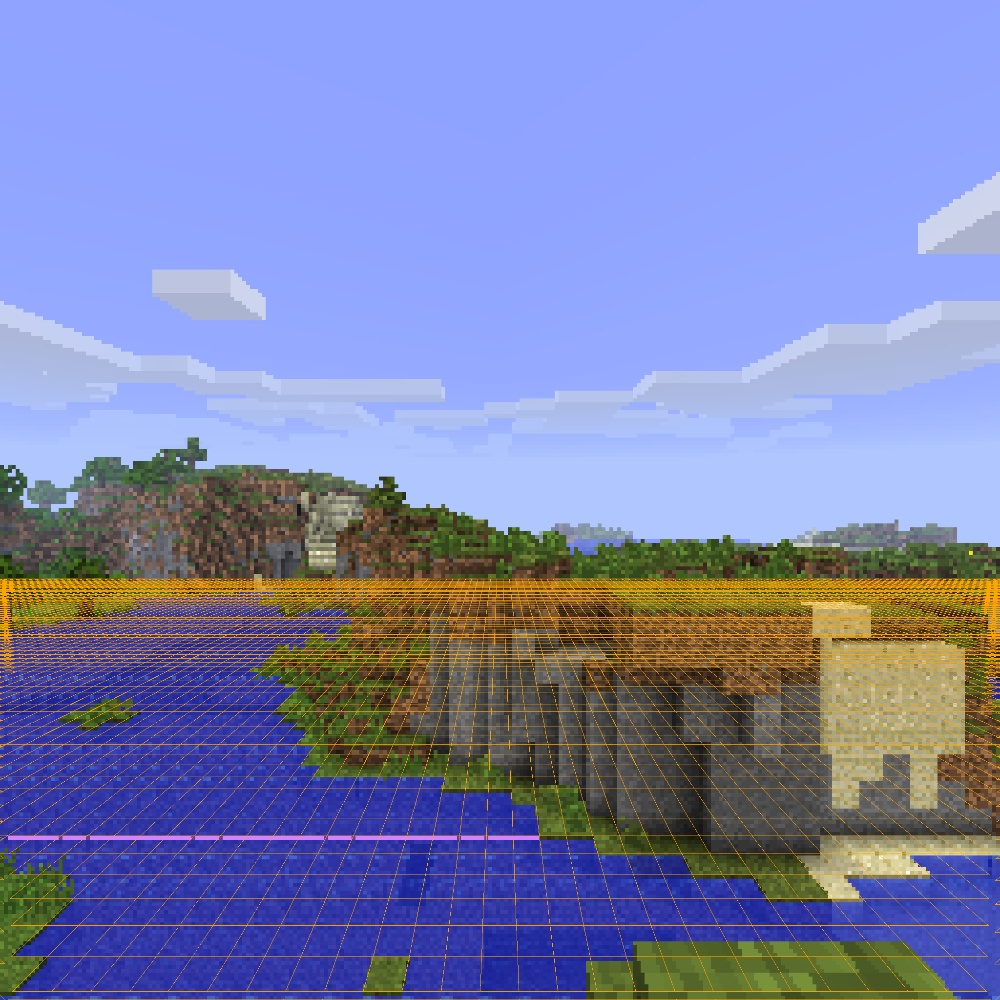

In [9]:
front

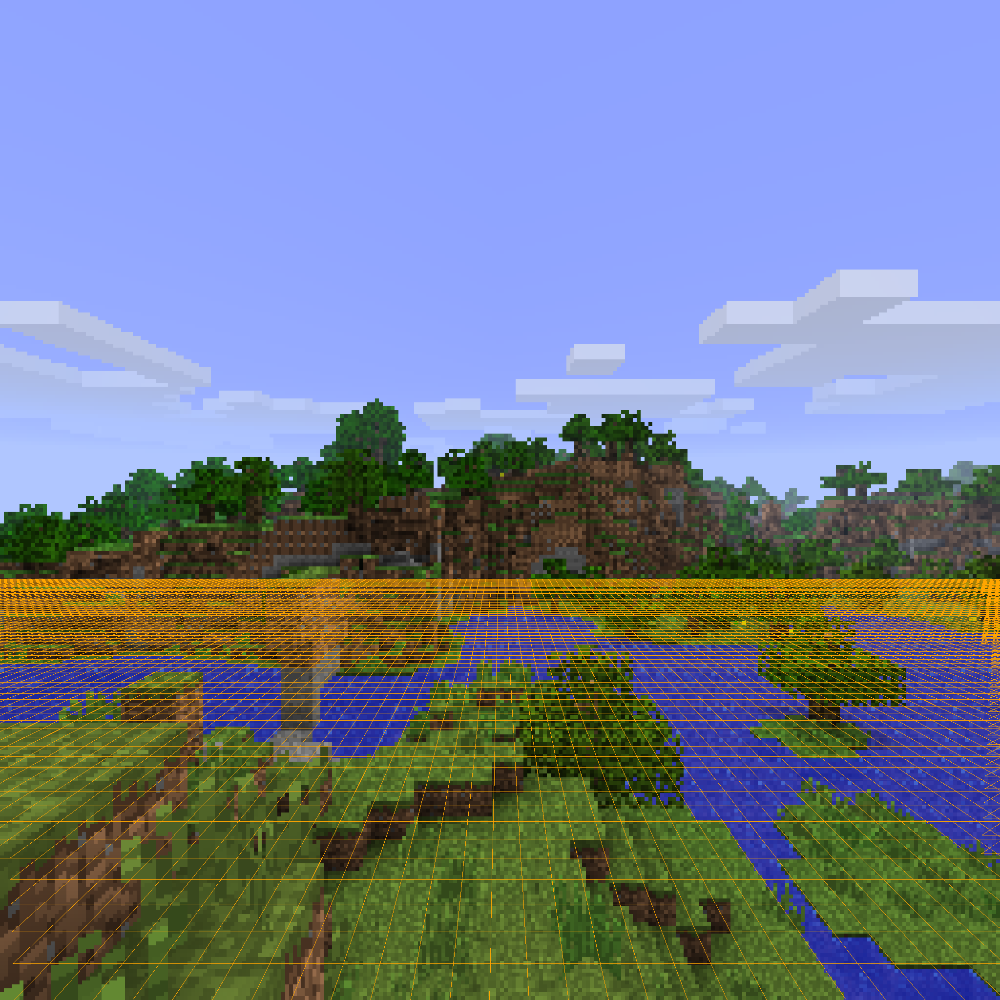

In [10]:
left

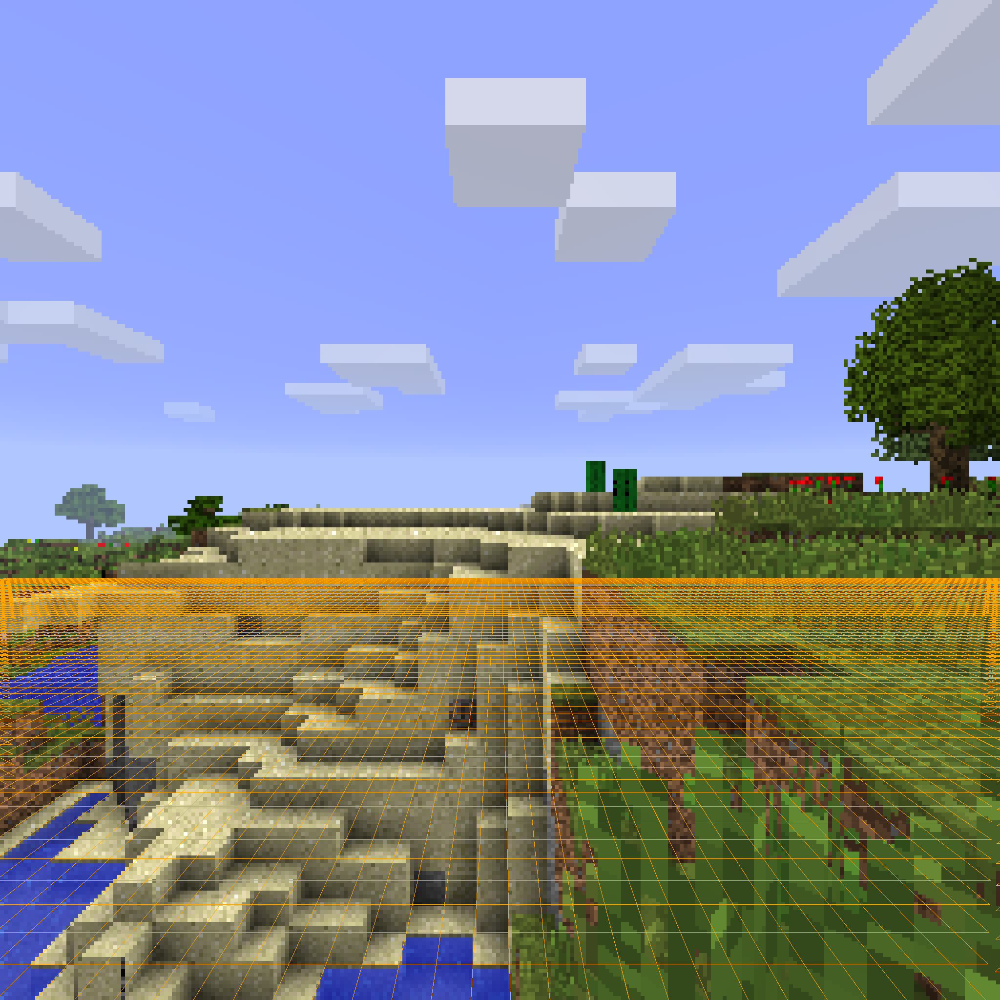

In [11]:
right

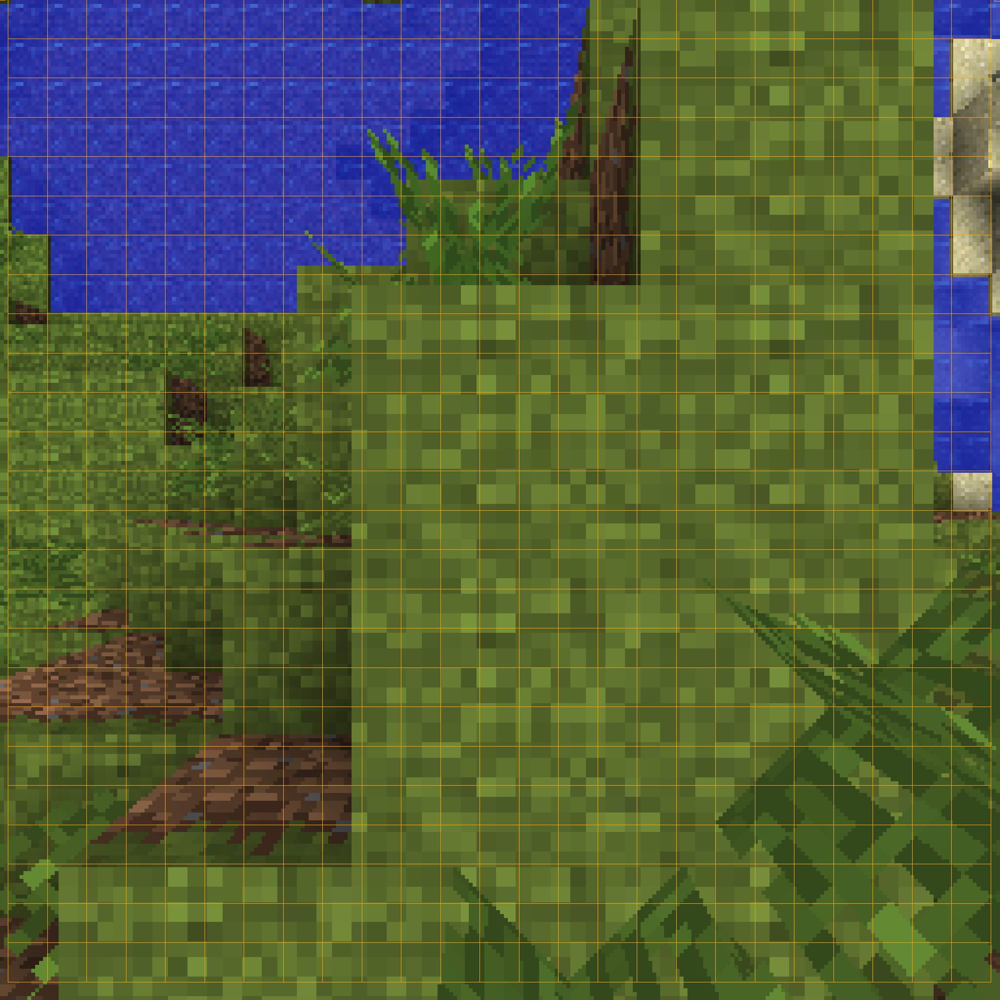

In [12]:
bottom